<a href="https://colab.research.google.com/github/parkhy0106/HolyMoly/blob/master/SAM%2BAutogluon(Hand_Gesture)/hand_gesture(auto_gluon%2BSAM).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from pathlib import Path
import json
from collections import defaultdict

#Autogluon Setup

In [ ]:
# Uninstall mkl for faster neural-network training time
!pip uninstall -y mkl
# Upgrade pip to ensure the latest package versions are available
!pip install -U pip
# Upgrade setuptools to be compatible with namespace packages
!pip install -U setuptools wheel
!pip install -U "mxnet<2.0.0"
# Install autogluon (Tutorial based on autogluon==0.1.0)
!pip install autogluon
# Upgrade ipykernel (Necessary for Colab)
!pip install -U ipykernel

Found existing installation: mkl 2019.0
Uninstalling mkl-2019.0:
  Successfully uninstalled mkl-2019.0
     |████████████████████████████████| 1.7 MB 5.3 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
     |████████████████████████████████| 946 kB 5.2 MB/s            
  Attempting uninstall: setuptools
    Found existing installation: setuptools 57.4.0
    Uninstalling setuptools-57.4.0:
      Successfully uninstalled setuptools-57.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


     |████████████████████████████████| 46.9 MB 87 kB/s             
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1
     |████████████████████████████████| 52 kB 1.3 MB/s             
     |████████████████████████████████| 56 kB 3.7 MB/s             
     |████████████████████████████████| 273 kB 12.1 MB/s            
     |████████████████████████████████| 352 kB 49.6 MB/s            
     |████████████████████████████████| 786 kB 57.8 MB/s            
     |████████████████████████████████| 206 kB 64.1 MB/s            
     |████████████████████████████████| 131 kB 69.4 MB/s            
     |████████████████████████████████| 22.3 MB 57.9 MB/s            
     |████████████████████████████████| 27.4 MB 131 kB/s             
     |████████████████████████████████| 4.2 MB 58.9 MB/s            
     |████████████████████████████████| 119 kB 51.1 MB/s            
  Prepari

     |████████████████████████████████| 124 kB 4.7 MB/s            
     |████████████████████████████████| 788 kB 40.6 MB/s            
     |████████████████████████████████| 370 kB 65.4 MB/s            
  Attempting uninstall: prompt-toolkit
    Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Attempting uninstall: ipython
    Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0
  Attempting uninstall: ipykernel
    Found existing installation: ipykernel 4.10.1
    Uninstalling ipykernel-4.10.1:
      Successfully uninstalled ipykernel-4.10.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyter-console 5.2.0 requires prompt-toolkit<2.0.0,>=1.0.0, but you have prompt-toolkit 3.0.20 which is inco

In [ ]:
from autogluon.tabular import TabularPredictor

#기타 모듈들 로딩

In [ ]:
# 데이터 보기
import pandas as pd
import numpy as np
from glob import glob

# 이미지데이터 로딩
from PIL import Image
import cv2
from tqdm import tqdm

# 파일경로 설정
import os
import shutil
import json

# Modeling
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Others
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')
import matplotlib.pyplot as plt

In [ ]:
cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
data_path = './open'


train_path = data_path + '/train'
test_path = data_path + '/test'

hand_gesture = pd.read_csv(data_path + '/hand_gesture_pose.csv')
sample_submission = pd.read_csv(data_path + '/sample_submission.csv')

#Exploratory Data analysis

##data를 정상적으로 로딩해보기

In [ ]:
hand_gesture['pose_name'].unique()

array(['숫자 1', '숫자 2', '숫자 3', '숫자 4', '숫자 5', '숫자 6', '숫자 7', '숫자 8',
       '숫자 9', '숫자 0', '손가락 오므리기', '전화모양', '손 안경', '손가락 접기', '손 토끼', '최고',
       '약속', '검지,중지 교차', '엄지,중지 붙이기', '엄지,소지 붙이기', '파이팅', '총', '동그라미',
       'OK', '빅토리', '부정(엄지손 아래로)', '부정(검지 흔들기)', '손바닥', '약지,소지 가위', '꼬집기',
       '엄지,약지 붙이기', '손하트', '네모', '세모', 'X', '숫자1', '숫자2', '숫자6', '숫자7',
       '숫자8', '숫자0', '숫자3', '숫자4', '숫자5', '숫자9', '경고(주먹 내밀기)', '주먹쥐기',
       '큰하트'], dtype=object)

In [ ]:
train_folders = sorted(glob(train_path + '/*'), key = lambda x : int(x.split('/')[-1]))
test_folders  = sorted(glob(test_path + '/*'), key = lambda x : int(x.split('/')[-1]))
train_folders[:5]

['./open/train/0',
 './open/train/1',
 './open/train/2',
 './open/train/3',
 './open/train/4']

In [ ]:
train_folder = train_folders[0]

image_paths = sorted(glob(train_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
json_path   = glob(train_folder + '/*.json')[0]

(1080, 1920, 3)


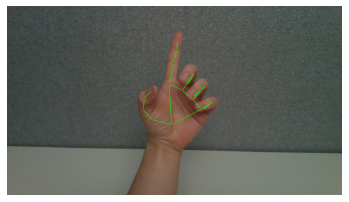

In [ ]:
image_path = image_paths[0]
img = Image.open(image_path)
img_arr = np.array(img)
print(img_arr.shape)
plt.imshow(img_arr)
plt.axis('off')
plt.show()

In [ ]:
js = json.load(open(json_path))

print("json keys              : ", js.keys())

print("json action info       : ",js.get('action'))

print("json actor info        : ",js.get('actor'))

print("json annotations keys  : ",js.get('annotations')[0].keys())

json keys              :  dict_keys(['action', 'actor', 'id', 'annotations'])
json action info       :  [0, '숫자 1']
json actor info        :  None
json annotations keys  :  dict_keys(['image_id', 'data'])


##Data의 hand_gesture category에 데이터가 전부 존재하는지 확인

In [ ]:
hand_gesture['pose_name'].unique()

array(['숫자 1', '숫자 2', '숫자 3', '숫자 4', '숫자 5', '숫자 6', '숫자 7', '숫자 8',
       '숫자 9', '숫자 0', '손가락 오므리기', '전화모양', '손 안경', '손가락 접기', '손 토끼', '최고',
       '약속', '검지,중지 교차', '엄지,중지 붙이기', '엄지,소지 붙이기', '파이팅', '총', '동그라미',
       'OK', '빅토리', '부정(엄지손 아래로)', '부정(검지 흔들기)', '손바닥', '약지,소지 가위', '꼬집기',
       '엄지,약지 붙이기', '손하트', '네모', '세모', 'X', '숫자1', '숫자2', '숫자6', '숫자7',
       '숫자8', '숫자0', '숫자3', '숫자4', '숫자5', '숫자9', '경고(주먹 내밀기)', '주먹쥐기',
       '큰하트'], dtype=object)

In [ ]:
data = []
for y in hand_gesture['pose_name'].unique():
  temp = 0
  for x in range(len(train_folders)):
    json_path = glob(train_folders[x] + '/*.json')[0]
    js = json.load(open(json_path))
    if js.get('action')[1] == y:
      temp += 1
  data.append([y,temp])



In [ ]:
len(data)

48

In [ ]:
len(hand_gesture['pose_name'].unique())

48

In [ ]:
x = []
y = []
for z in range(len(data)):
  x.append(data[z][0])
  y.append(data[z][1])

In [ ]:
'숫자 1', 7],
'숫자 2', 9],
'숫자 3', 11],
'숫자 4',
'숫자 5',
'숫자 6',
'숫자 7',
'숫자 8',
'숫자 9',
'숫자 0'

In [ ]:
data

[['숫자 1', 7],
 ['숫자 2', 9],
 ['숫자 3', 11],
 ['숫자 4', 11],
 ['숫자 5', 10],
 ['숫자 6', 8],
 ['숫자 7', 9],
 ['숫자 8', 11],
 ['숫자 9', 11],
 ['숫자 0', 11],
 ['손가락 오므리기', 14],
 ['전화모양', 30],
 ['손 안경', 30],
 ['손가락 접기', 20],
 ['손 토끼', 12],
 ['최고', 23],
 ['약속', 46],
 ['검지,중지 교차', 13],
 ['엄지,중지 붙이기', 18],
 ['엄지,소지 붙이기', 13],
 ['파이팅', 21],
 ['총', 22],
 ['동그라미', 22],
 ['OK', 23],
 ['빅토리', 27],
 ['부정(엄지손 아래로)', 23],
 ['부정(검지 흔들기)', 20],
 ['손바닥', 24],
 ['약지,소지 가위', 20],
 ['꼬집기', 12],
 ['엄지,약지 붙이기', 15],
 ['손하트', 4],
 ['네모', 6],
 ['세모', 5],
 ['X', 5],
 ['숫자1', 6],
 ['숫자2', 6],
 ['숫자6', 5],
 ['숫자7', 9],
 ['숫자8', 9],
 ['숫자0', 7],
 ['숫자3', 4],
 ['숫자4', 5],
 ['숫자5', 3],
 ['숫자9', 5],
 ['경고(주먹 내밀기)', 13],
 ['주먹쥐기', 7],
 ['큰하트', 4]]

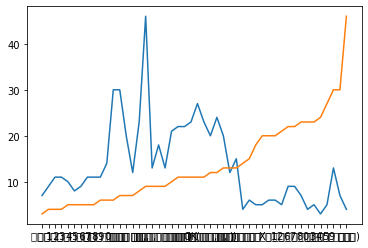

mean :  13.520833333333334
std : 8.793912627809965


In [ ]:
plt.plot(x,y)
plt.plot(x,sorted(y))
plt.show()

print("mean : ",np.mean(y))
print("std :",np.std(y))

＊누락된 index는 없는 것으로 보인다. 데이터 자체의 불균등은 확인할 수 있다.

##Data label fault explore

(1080, 1920, 3)


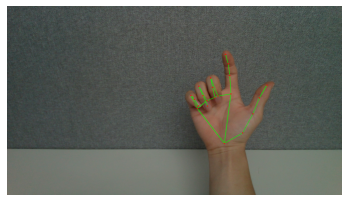

./open/train/32
(1080, 1920, 3)


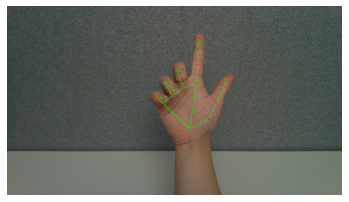

./open/train/33
(1080, 1920, 3)


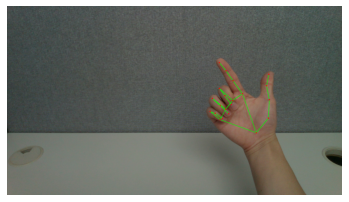

./open/train/34
(1080, 1920, 3)


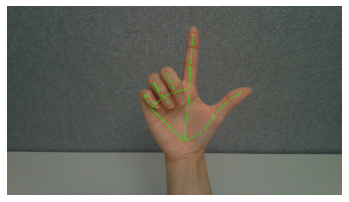

./open/train/35
(1080, 1920, 3)


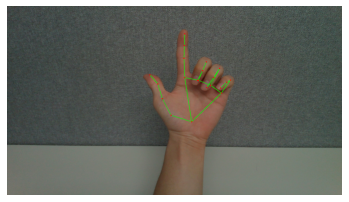

./open/train/253
(1080, 1920, 3)


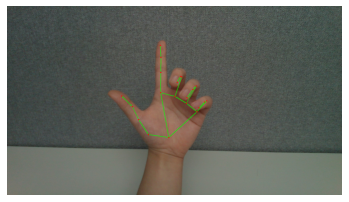

./open/train/254
(1080, 1920, 3)


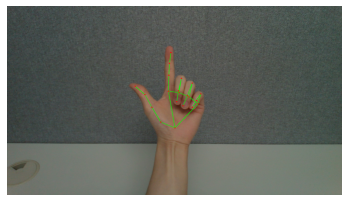

./open/train/255
(1080, 1920, 3)


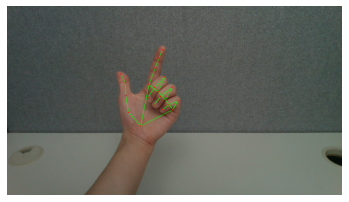

./open/train/256
(1080, 1920, 3)


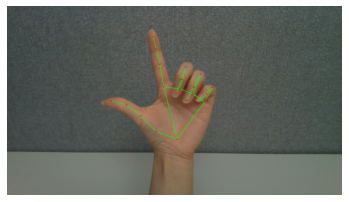

./open/train/257
(1080, 1920, 3)


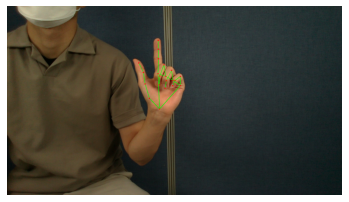

./open/train/359
(1080, 1920, 3)


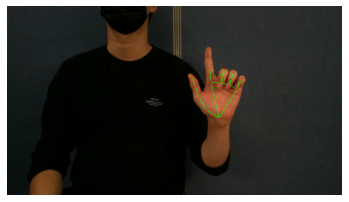

./open/train/360
(1080, 1920, 3)


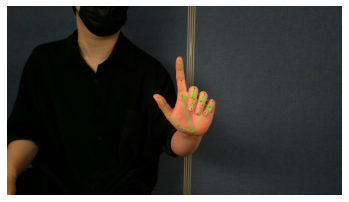

./open/train/361
(1080, 1920, 3)


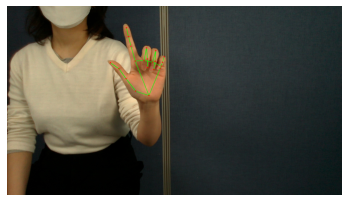

./open/train/362
(1080, 1920, 3)


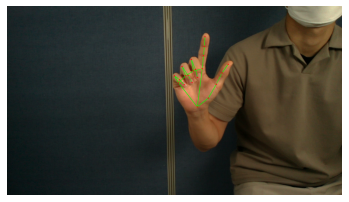

./open/train/391
(1080, 1920, 3)


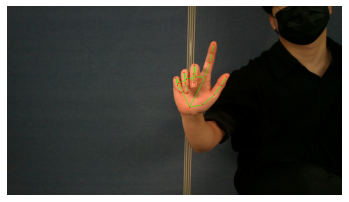

./open/train/392
(1080, 1920, 3)


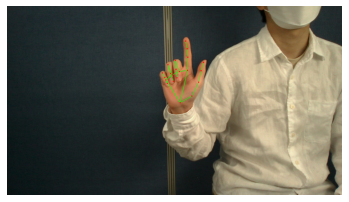

./open/train/393
(1080, 1920, 3)


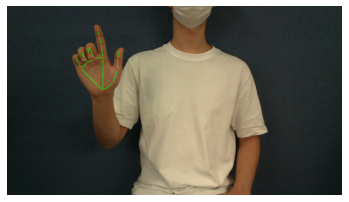

./open/train/394
(1080, 1920, 3)


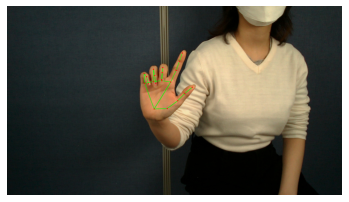

./open/train/395


In [ ]:
for x in range(len(train_folders)):
  json_path = glob(train_folders[x] + '/*.json')[0]
  js = json.load(open(json_path))
  if js.get('action')[1] == '숫자 7':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])
  if js.get('action')[1] == '숫자7':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])

숫자 카테고리가 숫자 7, 숫자7과 같이 데이터가 혼재되어있다. 심지어 id값도 달라 따로 처리해주어야 한다. (1인칭, 3인칭의 차이)

(1080, 1920, 3)


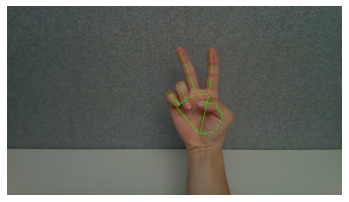

./open/train/7
(1080, 1920, 3)


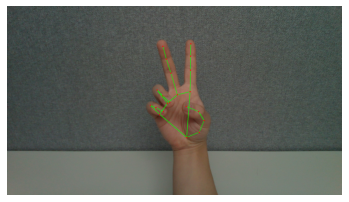

./open/train/8
(1080, 1920, 3)


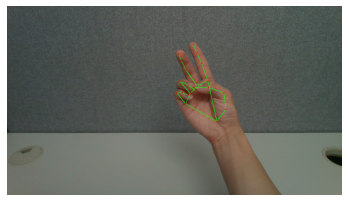

./open/train/9
(1080, 1920, 3)


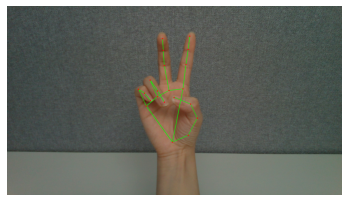

./open/train/10
(1080, 1920, 3)


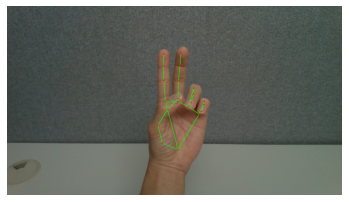

./open/train/53
(1080, 1920, 3)


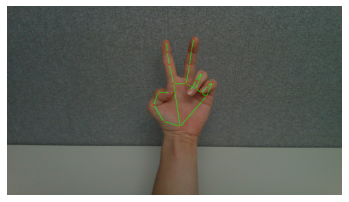

./open/train/54
(1080, 1920, 3)


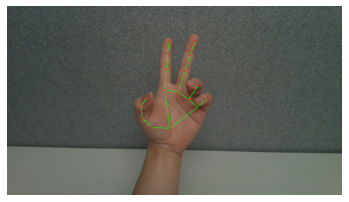

./open/train/55
(1080, 1920, 3)


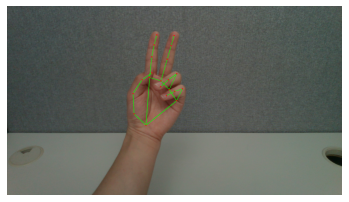

./open/train/56
(1080, 1920, 3)


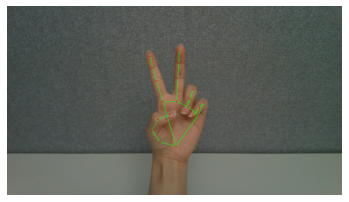

./open/train/57
(1080, 1920, 3)


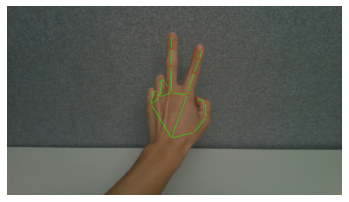

./open/train/136
(1080, 1920, 3)


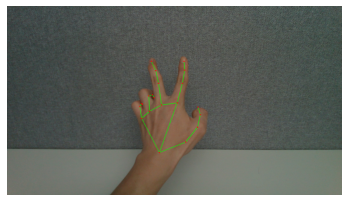

./open/train/137
(1080, 1920, 3)


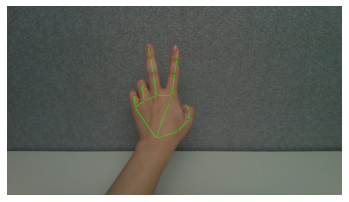

./open/train/138
(1080, 1920, 3)


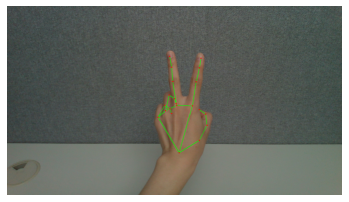

./open/train/139
(1080, 1920, 3)


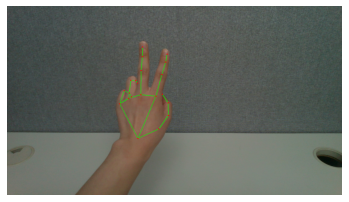

./open/train/140
(1080, 1920, 3)


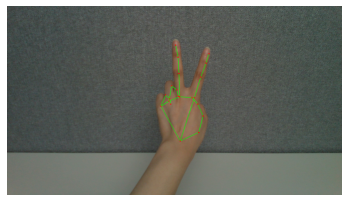

./open/train/141
(1080, 1920, 3)


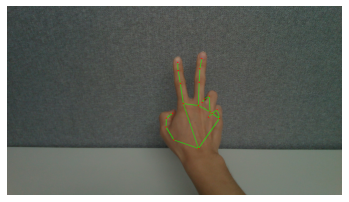

./open/train/231
(1080, 1920, 3)


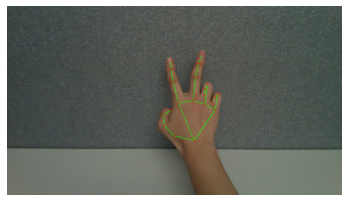

./open/train/232
(1080, 1920, 3)


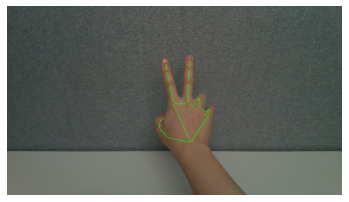

./open/train/233
(1080, 1920, 3)


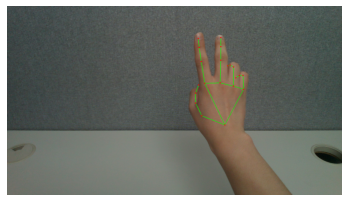

./open/train/234
(1080, 1920, 3)


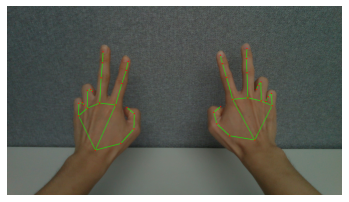

./open/train/332
(1080, 1920, 3)


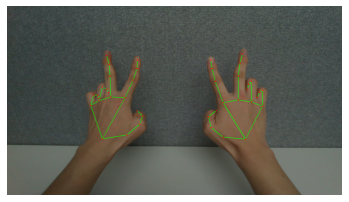

./open/train/333
(1080, 1920, 3)


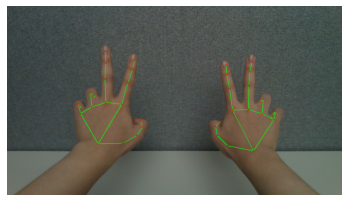

./open/train/334
(1080, 1920, 3)


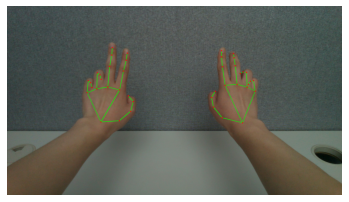

./open/train/335
(1080, 1920, 3)


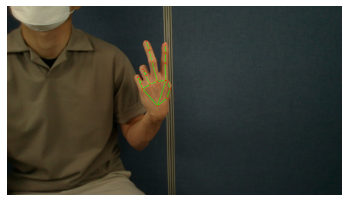

./open/train/479
(1080, 1920, 3)


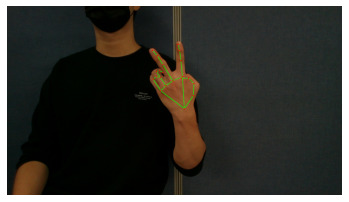

./open/train/480
(1080, 1920, 3)


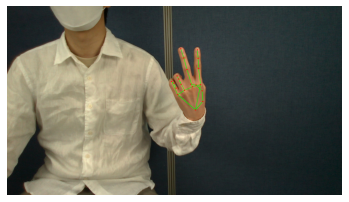

./open/train/481
(1080, 1920, 3)


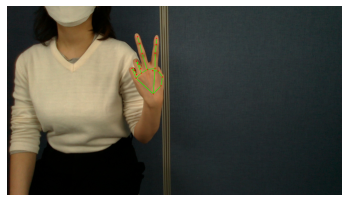

./open/train/482
(1080, 1920, 3)


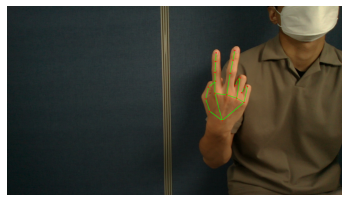

./open/train/578
(1080, 1920, 3)


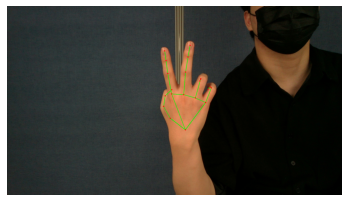

./open/train/579
(1080, 1920, 3)


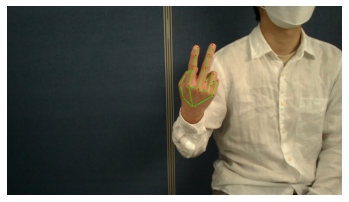

./open/train/580
(1080, 1920, 3)


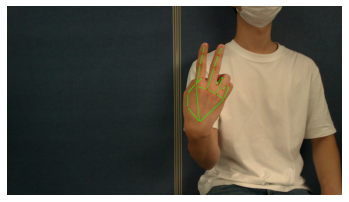

./open/train/581
(1080, 1920, 3)


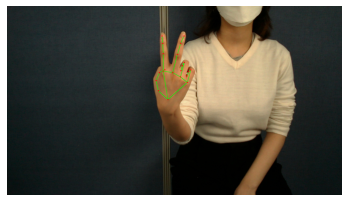

./open/train/582
(1080, 1920, 3)


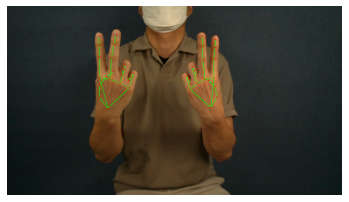

./open/train/641
(1080, 1920, 3)


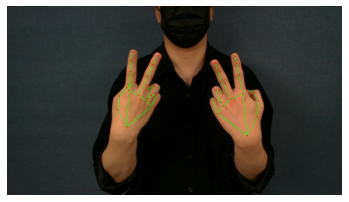

./open/train/642
(1080, 1920, 3)


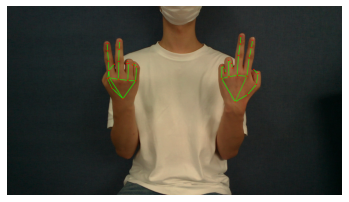

./open/train/643
(1080, 1920, 3)


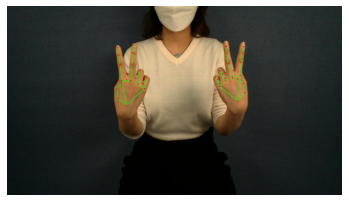

./open/train/644


In [ ]:
for x in range(len(train_folders)):
  json_path = glob(train_folders[x] + '/*.json')[0]
  js = json.load(open(json_path))
  if js.get('action')[1] == '빅토리':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])
  if js.get('action')[1] == '숫자 2':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])

빅토리나 숫자 2, 동그라미와 OK사인과 같이 애매한 손동작도 있다.

(1080, 1920, 3)


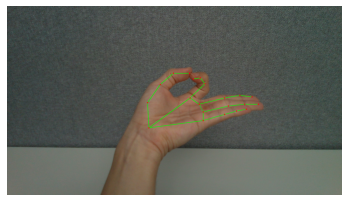

./open/train/120
(1080, 1920, 3)


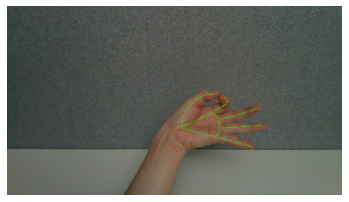

./open/train/121
(1080, 1920, 3)


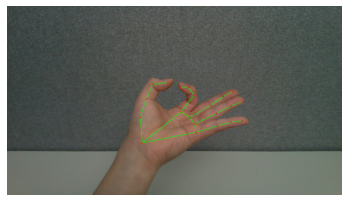

./open/train/122
(1080, 1920, 3)


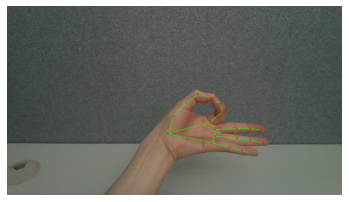

./open/train/123
(1080, 1920, 3)


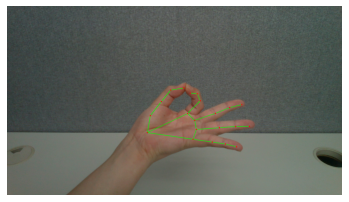

./open/train/124
(1080, 1920, 3)


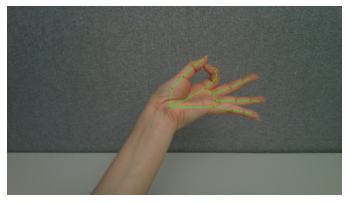

./open/train/125
(1080, 1920, 3)


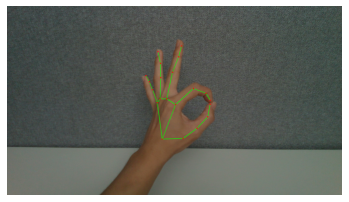

./open/train/126
(1080, 1920, 3)


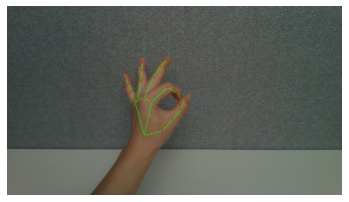

./open/train/127
(1080, 1920, 3)


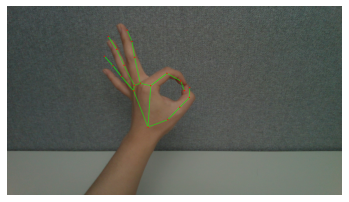

./open/train/128
(1080, 1920, 3)


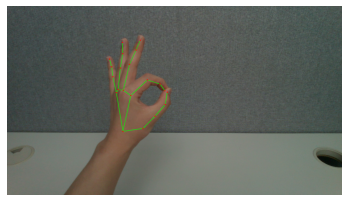

./open/train/129
(1080, 1920, 3)


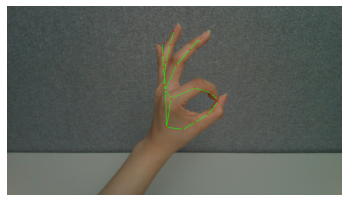

./open/train/130
(1080, 1920, 3)


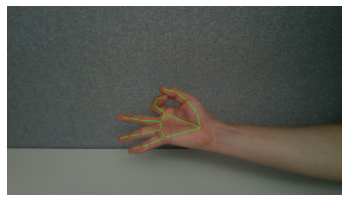

./open/train/223
(1080, 1920, 3)


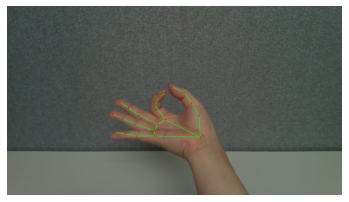

./open/train/224
(1080, 1920, 3)


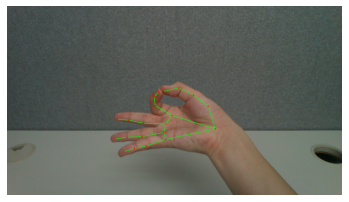

./open/train/225
(1080, 1920, 3)


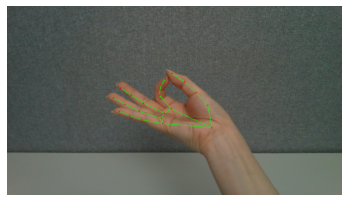

./open/train/226
(1080, 1920, 3)


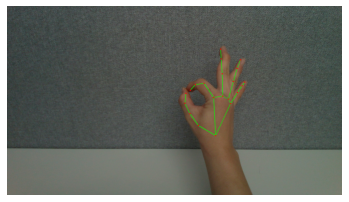

./open/train/227
(1080, 1920, 3)


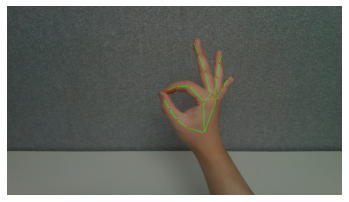

./open/train/228
(1080, 1920, 3)


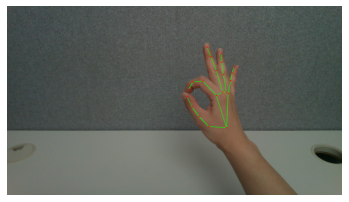

./open/train/229
(1080, 1920, 3)


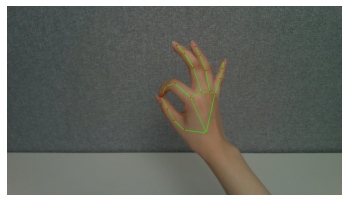

./open/train/230
(1080, 1920, 3)


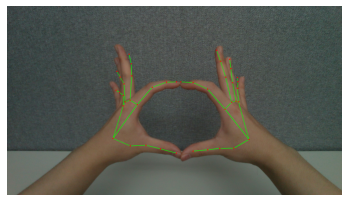

./open/train/325
(1080, 1920, 3)


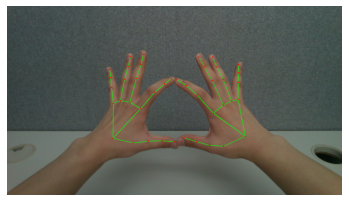

./open/train/326
(1080, 1920, 3)


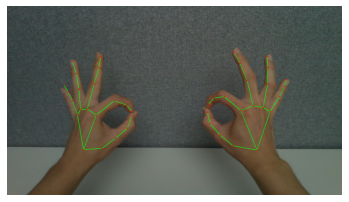

./open/train/328
(1080, 1920, 3)


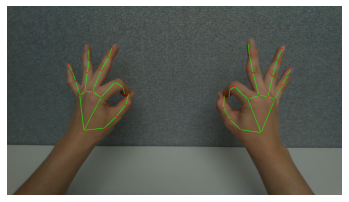

./open/train/329
(1080, 1920, 3)


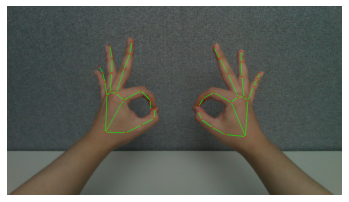

./open/train/330
(1080, 1920, 3)


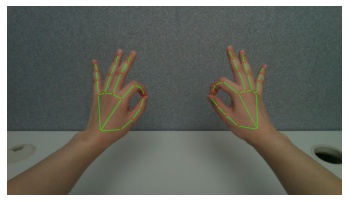

./open/train/331
(1080, 1920, 3)


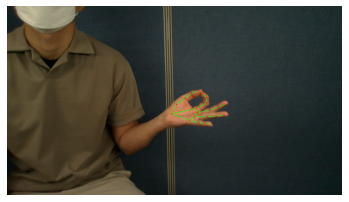

./open/train/466
(1080, 1920, 3)


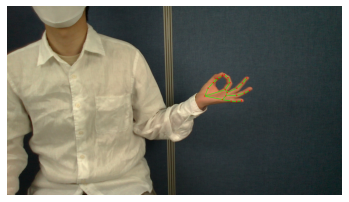

./open/train/467
(1080, 1920, 3)


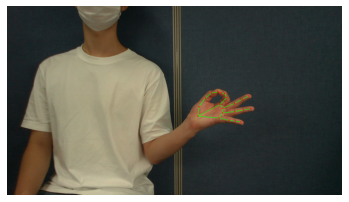

./open/train/468
(1080, 1920, 3)


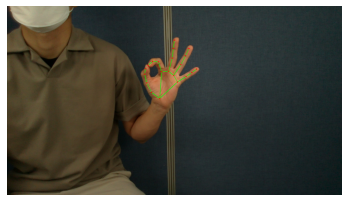

./open/train/474
(1080, 1920, 3)


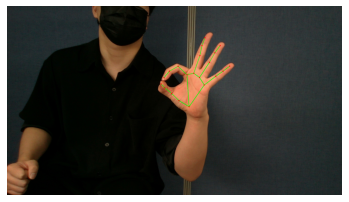

./open/train/475
(1080, 1920, 3)


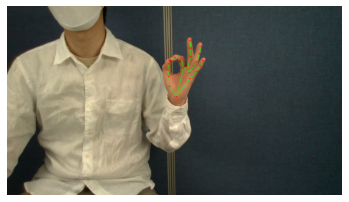

./open/train/476
(1080, 1920, 3)


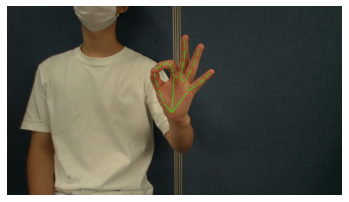

./open/train/477
(1080, 1920, 3)


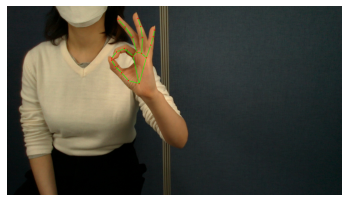

./open/train/478
(1080, 1920, 3)


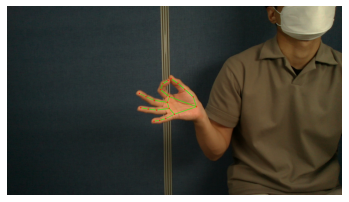

./open/train/569
(1080, 1920, 3)


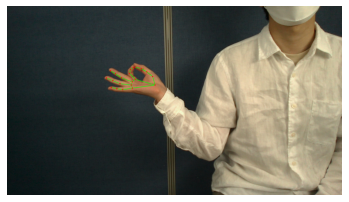

./open/train/570
(1080, 1920, 3)


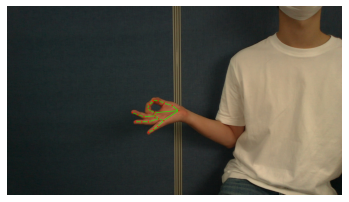

./open/train/571
(1080, 1920, 3)


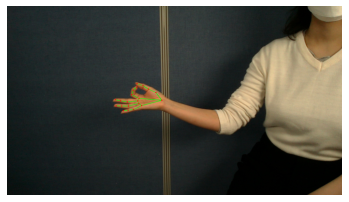

./open/train/572
(1080, 1920, 3)


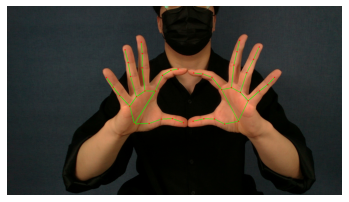

./open/train/626
(1080, 1920, 3)


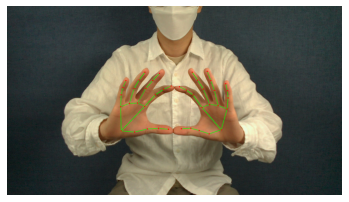

./open/train/627
(1080, 1920, 3)


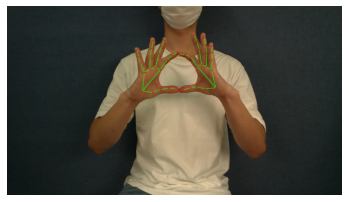

./open/train/628
(1080, 1920, 3)


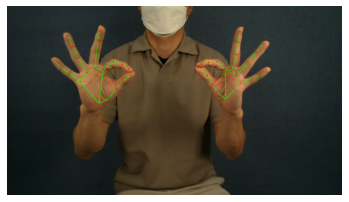

./open/train/636
(1080, 1920, 3)


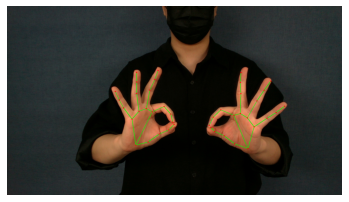

./open/train/637
(1080, 1920, 3)


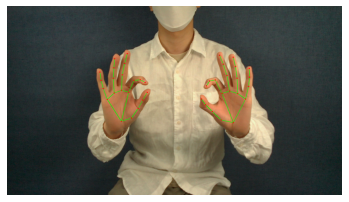

./open/train/638
(1080, 1920, 3)


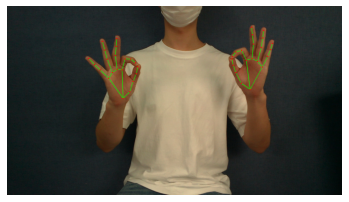

./open/train/639
(1080, 1920, 3)


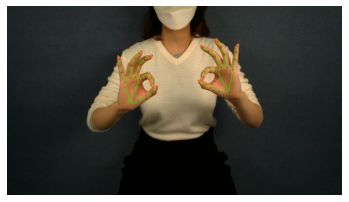

./open/train/640


In [ ]:
for x in range(len(train_folders)):
  json_path = glob(train_folders[x] + '/*.json')[0]
  js = json.load(open(json_path))
  if js.get('action')[1] == 'OK':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])
  if js.get('action')[1] == '동그라미':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])

심지어 동작이 애매해서 손가락끼리 제대로 붙어있지 않은 경우도 있다. 이런건 어찌 처리해야하나...


(1080, 1920, 3)


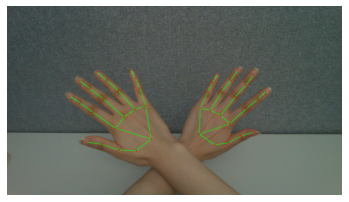

./open/train/327
(1080, 1920, 3)


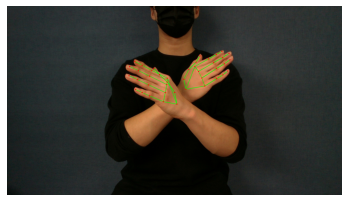

./open/train/632
(1080, 1920, 3)


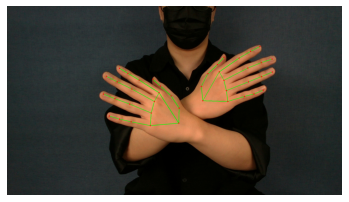

./open/train/633
(1080, 1920, 3)


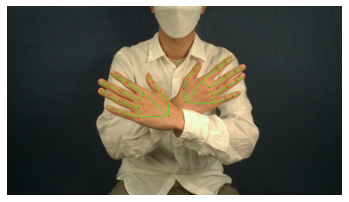

./open/train/634
(1080, 1920, 3)


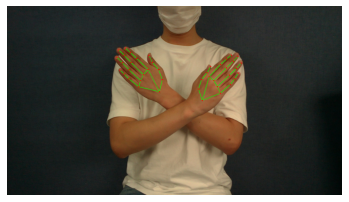

./open/train/635


In [ ]:
for x in range(len(train_folders)):
  json_path = glob(train_folders[x] + '/*.json')[0]
  js = json.load(open(json_path))
  if js.get('action')[1] == 'X':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])
  if js.get('action')[1] == '':
    image_paths = sorted(glob(train_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
    image_path = image_paths[0]
    img = Image.open(image_path)
    img_arr = np.array(img)
    print(img_arr.shape)
    plt.imshow(img_arr)
    plt.axis('off')
    plt.show()
    print(train_folders[x])

X와 같이 손동작 자체는 큰 관련이 없고, 팔의 위치가 더 중요한 동작들이 있다. 이런 경우 팔의 orient가 더 중요할 수 있는데, 문제점은 팔의 keypoint를 표시할만한 annotation이 없다는 것.

즉, 양팔인지, 왼팔인지, 오른팔인지, 3인칭인지, 1인칭인지를 구분해낼 수 있는 1차적인 코드가 필요하다는 것.

##Keypoint error detection(dacon code)

In [ ]:
from PIL import Image
from tqdm import tqdm
import traceback
import matplotlib.pyplot as plt
import time

In [ ]:
def return_error(step, e):
    print('=' * 10)
    print(f'[STEP {step}] UNEXPECTED ERROR OCCURED : ',e)
    print(traceback.format_exc())
    print('='*1)
    print('')
    return 0

In [ ]:
folders = sorted(glob(os.path.join(data_path, 'test' )+ '/*'), key = lambda x : int(x.split('/')[-1]) )

In [ ]:
folders[0]

'./open/test/649'

In [ ]:
data_path

'./open'

In [ ]:
json.load(open(glob(folders[0] + '/*.json')[0])).get('annotations')[0].get('data')

21

In [ ]:
def find_error_keypoints(is_train = False):
    
    if is_train : 
        target = 'train'
    else : 
        target = 'test'
    # 폴더 경로 설정
    step = 1
    try : 
        data_path = './open'
        folder_paths = os.path.join(data_path, target )
        print("folder_path : " , folder_paths)
    except Exception as e: 
        return_error(step, e)
        return -1

    # 폴더 경로의 파일 불러오기
    step = 2
    try :     
        folders = sorted(glob(folder_paths + '/*'), key = lambda x : int(x.split('/')[-1]) )
    except Exception as e :
        return_error(step, e)
        return -1
    
    # 이미지와 json을 하나의 list에 저장
    step = 3

    correct_image_paths = []
    wrong_image_paths = []    
    try : 
        for folder_path in tqdm(folders, total = len(folders)) : 
            
            # 이미지와 json 파일 불러오기
            step = 4
            try : 
                image_paths = sorted(glob(folder_path + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
                json_path       = glob(folder_path + '/*.json')[0]
                keypoints = json.load(open(json_path)).get('annotations')
            except Exception as e:
                pass
            
            # 이미지와 json파일 저장
            step = 5
            try : 
                images_and_json  = []
                for num, image_path in enumerate(image_paths) : 
                    step = 6
                    try: 
                        correct  = True
                        image = Image.open(image_path)
                        image = image.convert('RGB')
                        keypoint = keypoints[num].get('data')
                        xy = [(x,y) for x,y,z in keypoint]
                        for key in xy :
                            color = image.getpixel(key)
                            if color[0] < 250 :
                                if color[1] >= 250 :
                                    continue;
                                else:
                                    wrong_image_paths.append([image_path, image, key])
                                    correct = False
                                    break;
                        if correct == True : 
                            correct_image_paths.append(image_path) 
                    except Exception as e :
                        print('=' * 30, "  NO IMAGE  ", '=' * 30)
                        print(image_path)

    
            except Exception as e:
                    print('=' * 30, "  NO IMAGE  ", '=' * 30)
                    print(image_path)
                    
    except Exception as e:
            return_error(step, e)
            return -1
        
    return correct_image_paths, wrong_image_paths    

In [ ]:
train_wrong_image_paths[0][1]

NameError: ignored

In [ ]:
train_correct_image_paths, train_wrong_image_paths = find_error_keypoints(is_train  = True)
test_correct_image_paths, test_wrong_image_paths = find_error_keypoints(is_train  =False)

folder_path :  ./open/train


  0%|          | 1/649 [00:03<35:32,  3.29s/it]

==============================   NO IMAGE   ==============================
./open/train/0/9.png


100%|██████████| 649/649 [16:34<00:00,  1.53s/it]


==============================   NO IMAGE   ==============================
./open/train/287/1.png
==============================   NO IMAGE   ==============================
./open/train/287/2.png
==============================   NO IMAGE   ==============================
./open/train/287/3.png
==============================   NO IMAGE   ==============================
./open/train/287/4.png
==============================   NO IMAGE   ==============================
./open/train/287/5.png
==============================   NO IMAGE   ==============================
./open/train/287/6.png
==============================   NO IMAGE   ==============================
./open/train/287/7.png
==============================   NO IMAGE   ==============================
./open/train/287/8.png
==============================   NO IMAGE   ==============================
./open/train/287/9.png
folder_path :  ./open/test


0it [00:00, ?it/s]


In [ ]:
for wrong_image_path in train_wrong_image_paths:
    img_path, img, _ = wrong_image_path

    img_num = int(img_path.split('/')[-1].split('.')[0])
    js = json.load(open(glob('/'.join(img_path.split('/')[:4])+'/*.json')[0])).get('annotations')[img_num].get('data')
    keys = [(x,y) for x,y,z in js]
    keys = np.array(keys)

    plt.figure(figsize = (13,13))
    plt.title(img_path)
    plt.imshow(img)
    plt.scatter(keys[:,0], keys[:,1])
    plt.show()

In [ ]:
test_correct_image_paths, test_wrong_image_paths = find_error_keypoints(is_train  =False)

model의 추론은 다음의 2단계를 따라야 할 것 같다. Orientation과 Perspective

1. Orientation(Left, Right, Both)과 Perspective 를 classification 하는 image model
2. 각 Finger간의 곡률(접힌 정도의 추측이라고 예상), Hand direction을 바탕으로 손동작을 구분하는 Regression model



In [ ]:
json.load(open(glob('/'.join(img_path.split('/')[:4])+'/*.json')[0])).get('action')[0]

NameError: ignored

In [ ]:
for wrong_image_path in test_wrong_image_paths:
    img_path, img, _ = wrong_image_path
    try:
      img_num = int(img_path.split('/')[-1].split('.')[0])
      js = json.load(open(glob('/'.join(img_path.split('/')[:4])+'/*.json')[0])).get('annotations')[img_num].get('data')
      keys = [(x,y) for x,y,z in js]
    except Exception as e:
      pass
    keys = np.array(keys)
    plt.figure(figsize = (13,13))
    plt.title(img_path)
    plt.imshow(img)
    plt.scatter(keys[:,0], keys[:,1])
    plt.show()

#이미지 모델을 이용한 전처리 분류(SAM) with TPU



In [ ]:
!git clone https://github.com/sayakpaul/Sharpness-Aware-Minimization-TensorFlow

fatal: destination path 'Sharpness-Aware-Minimization-TensorFlow' already exists and is not an empty directory.


In [ ]:
import sys
sys.path.append("Sharpness-Aware-Minimization-TensorFlow")

In [ ]:
import tensorflow as tf
tf.random.set_seed(42)
print(tf.__version__)

2.6.0


In [ ]:
try: # detect TPUs
    tpu = None
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver() # TPU detection
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except ValueError: # detect GPUs
    strategy = tf.distribute.MirroredStrategy() # for GPU or multi-GPU machines
  
print("Number of accelerators: ", strategy.num_replicas_in_sync)

2021-10-14 09:20:59.504635: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-10-14 09:20:59.504724: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (e6cabf933dbb): /proc/driver/nvidia/version does not exist
2021-10-14 09:20:59.611039: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job worker -> {0 -> 10.69.57.186:8470}
2021-10-14 09:20:59.611103: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job localhost -> {0 -> localhost:33348}
2021-10-14 09:20:59.635013: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job worker -> {0 -> 10.69.57.186:8470}
2021-10-14 09:20:59.635101: I tensorflow/core/distributed_runtime/rpc/grpc_channel.cc:272] Initialize GrpcChannelCache for job localhost -> {0 -> lo

Number of accelerators:  8


In [ ]:
import matplotlib.pyplot as plt
import resnet_cifar10
import utils
import time

## Load Dataset and Prepare Data Loaders

In [ ]:
pose_data = hand_gesture

In [ ]:
pose_data[pose_data['pose_id']==155]['hand_type'].unique()[0]

'right'

In [ ]:
pose_data

,pose_id,pose_type,pose_name,gesture_type,hand_type,view_type
0,0,number,숫자 1,my_hand,left,1st
1,1,number,숫자 2,my_hand,left,1st
2,2,number,숫자 3,my_hand,left,1st
3,3,number,숫자 4,my_hand,left,1st
4,4,number,숫자 5,my_hand,left,1st
...,...,...,...,...,...,...
152,191,meaning,경고(주먹 내밀기),your_hand,both,3rd
153,192,meaning,X,your_hand,both,3rd
154,193,meaning,OK,your_hand,both,3rd
155,194,meaning,빅토리,your_hand,both,3rd


In [ ]:
#make sparse matrix
#hand right left both
#pers 1st 3rd
'''
    right  left   both
1st   0      1      2
3rd   3      4      5
'''

'\n    right  left   both\n1st   0      1      2\n3rd   3      4      5\n'

In [ ]:
from tqdm import tqdm

In [ ]:
x_train = []
y_train = []
x_test = []
y_test = []
for train_folder in tqdm(train_folders,total = len(train_folders)):
  image_paths = sorted(glob(train_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
  for image_path in image_paths:
    try:
      #################x_train#####################
      img = Image.open(image_path)
      x_train.append(img.resize([32,32]))
      #################y_train#####################
      img_num = int(image_path.split('/')[-1].split('.')[0])
      action_num = json.load(open(glob('/'.join(image_path.split('/')[:4])+'/*.json')[0])).get('action')[0]
      hand_typ = pose_data[pose_data['pose_id']==action_num]['hand_type'].unique()[0]
      pers_typ = pose_data[pose_data['pose_id']==action_num]['view_type'].unique()[0]
      if hand_typ == 'right':
        if pers_typ == '3rd':
          y_train.append(np.array([3]))     
        else:
          y_train.append(np.array([0]))   
      elif hand_typ == 'left':
        if pers_typ == '3rd':
          y_train.append(np.array([4]))    
        else:
          y_train.append(np.array([1]))        
      else:
        if pers_typ == '3rd':
          y_train.append(np.array([5]))
        else: 
          y_train.append(np.array([2]))
    except Exception as e:
      pass

100%|██████████| 649/649 [46:05<00:00,  4.26s/it]


In [ ]:
import copy

In [ ]:
a = copy.deepcopy(x_train)
b = copy.deepcopy(y_train)

In [ ]:
json.load(open(glob('/'.join(image_paths[0].split('/')[:4])+'/*.json')[0])).get('action')

[195, '부정(엄지손 아래로)']

In [ ]:
import random

c = list(zip(a, b))

random.shuffle(c)

a, b = zip(*c)

x_train = a
y_train = b

In [ ]:
y_train[0]

array([0])

In [ ]:
x_train = []
y_train = []
x_test = []
y_test = []
for mola in range(len(a)):
  if mola < int(len(a)*0.1):
    x_test.append(a[mola])
    y_test.append(b[mola])
  else:
    x_train.append(a[mola])
    y_train.append(b[mola])
   

In [ ]:
xtr = copy.deepcopy(x_train)
ytr = copy.deepcopy(y_train)
xts = copy.deepcopy(x_test)
yts = copy.deepcopy(y_test)

In [ ]:
for x in range(len(xtr)):
  x_train[x] = np.asarray(xtr[x])
for x in range(len(xts)):
  x_test[x] = np.asarray(xts[x])

In [ ]:
BATCH_SIZE = 64 * strategy.num_replicas_in_sync
print(f"Batch size: {BATCH_SIZE}")
AUTO = tf.data.AUTOTUNE

def scale(image, label):
    image = tf.image.convert_image_dtype(image, tf.float32)
    label = tf.cast(label, tf.int32)
    return image, label

def augment(image,label):
    image = tf.image.resize_with_crop_or_pad(image, 40, 40) # Add 8 pixels of padding
    image = tf.image.random_crop(image, size=[32, 32, 3]) # Random crop back to 32x32
    image = tf.image.random_brightness(image, max_delta=0.5) # Random brightness
    image = tf.clip_by_value(image, 0., 1.)

    return image, label

train_ds = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_ds = (
    train_ds
    .shuffle(1024)
    .map(scale, num_parallel_calls=AUTO)
    .map(augment, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

test_ds = tf.data.Dataset.from_tensor_slices((x_test, y_test))
test_ds = (
    test_ds
    .map(scale, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

Batch size: 512


## Encapsulate SAM Logic 

SAM is implemented as follows - 

<center>
<img src="https://i.ibb.co/qRSfNX7/image.png"></img><br>
<small>Source: Original Paper</small>
</center>

In [ ]:
class SAMModel(tf.keras.Model):
    def __init__(self, resnet_model, rho=0.05):
        """
        p, q = 2 for optimal results as suggested in the paper
        (Section 2)
        """
        super(SAMModel, self).__init__()
        self.resnet_model = resnet_model
        self.rho = rho

    def train_step(self, data):
        (images, labels) = data
        e_ws = []
        with tf.GradientTape() as tape:
            predictions = self.resnet_model(images)
            loss = self.compiled_loss(labels, predictions)
        trainable_params = self.resnet_model.trainable_variables
        gradients = tape.gradient(loss, trainable_params)
        grad_norm = self._grad_norm(gradients)
        scale = self.rho / (grad_norm + 1e-12)
        
        with tf.GradientTape() as tape:
            predictions = self.resnet_model(images)
            loss = self.compiled_loss(labels, predictions)    
        for (grad, param) in zip(gradients, trainable_params):
            e_w = grad * scale
            param.assign_add(e_w)
            e_ws.append(e_w)
        sam_gradients = tape.gradient(loss, trainable_params)
        for (param, e_w) in zip(trainable_params, e_ws):
            param.assign_sub(e_w)
        
        self.optimizer.apply_gradients(
            zip(sam_gradients, trainable_params))

        self.compiled_metrics.update_state(labels, predictions)
        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        (images, labels) = data
        predictions = self.resnet_model(images, training=False)
        loss = self.compiled_loss(labels, predictions)
        self.compiled_metrics.update_state(labels, predictions)
        return {m.name: m.result() for m in self.metrics}

    def _grad_norm(self, gradients):
        norm = tf.norm(
            tf.stack([
                tf.norm(grad) for grad in gradients if grad is not None
            ])
        )
        return norm


## Define Callbacks

In [ ]:
train_callbacks = [
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", patience=10,
        restore_best_weights=True
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5,
        patience=3, verbose=1
    )
]

## Initialize Model with SAM and Train It

In [ ]:
with strategy.scope():
    model = SAMModel(utils.get_training_model())
model.compile(
    optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
)
print(f"Total learnable parameters: {model.resnet_model.count_params()/1e6} M")

Total learnable parameters: 0.575114 M


In [ ]:
start = time.time()
history = model.fit(train_ds,
                   validation_data=test_ds,
                   callbacks=train_callbacks,
                   epochs=130)
print(f"Total training time: {(time.time() - start)/60.} minutes")

Epoch 1/130
11/11 [==============================] - 41s 2s/step - loss: 4.5241 - accuracy: 0.1813 - val_loss: 1.7210 - val_accuracy: 0.4422
Epoch 2/130
11/11 [==============================] - 2s 166ms/step - loss: 1.7852 - accuracy: 0.2375 - val_loss: 1.6294 - val_accuracy: 0.3333
Epoch 3/130
11/11 [==============================] - 2s 156ms/step - loss: 1.6755 - accuracy: 0.3009 - val_loss: 1.4323 - val_accuracy: 0.5391
Epoch 4/130
11/11 [==============================] - 2s 162ms/step - loss: 1.4997 - accuracy: 0.3898 - val_loss: 1.1902 - val_accuracy: 0.5153
Epoch 5/130
11/11 [==============================] - 2s 157ms/step - loss: 1.4250 - accuracy: 0.4089 - val_loss: 1.0001 - val_accuracy: 0.5561
Epoch 6/130
11/11 [==============================] - 2s 214ms/step - loss: 1.2648 - accuracy: 0.4717 - val_loss: 0.9750 - val_accuracy: 0.4898
Epoch 7/130
11/11 [==============================] - 2s 160ms/step - loss: 1.0508 - accuracy: 0.5172 - val_loss: 0.7646 - val_accuracy: 0.5595
E

In [ ]:
!python

Python 3.7.12 (default, Sep 10 2021, 00:21:48) 
[GCC 7.5.0] on linux
Type "help", "copyright", "credits" or "license" for more information.
>>> 
KeyboardInterrupt
>>> 
KeyboardInterrupt
>>> 
KeyboardInterrupt
>>> ^C


In [ ]:
x_infer = []
for test_folder in tqdm(test_folders,total = len(test_folders)):
  image_paths = sorted(glob(test_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
  for image_path in image_paths:
    try:
      #################x_test#####################
      img = Image.open(image_path)
      x_infer.append(img.resize([32,32]))
    except Exception as e:
      pass

100%|██████████| 217/217 [12:49<00:00,  3.55s/it]


In [ ]:
xif = copy.deepcopy(x_infer)

In [ ]:
for x in range(len(xif)):
  x_infer[x] = np.asarray(xif[x])

In [ ]:
scale

<function __main__.scale(image, label)>

In [ ]:
BATCH_SIZE = 64 * strategy.num_replicas_in_sync
print(f"Batch size: {BATCH_SIZE}")
AUTO = tf.data.AUTOTUNE


def scale_inf(image):
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image

infer_ds = tf.data.Dataset.from_tensor_slices((x_infer))
infer_ds = (
    infer_ds
    .batch(BATCH_SIZE)
    .map(scale_inf , num_parallel_calls=AUTO)
    .prefetch(AUTO)
)

Batch size: 512


In [ ]:
infer_ds

<PrefetchDataset shapes: (None, 32, 32, 3), types: tf.float32>

In [ ]:
model.resnet_model.save('sam.h5')

Compiled the loaded model, but the compiled metrics have yet to be built. `model.compile_metrics` will be empty until you train or evaluate the model.


In [ ]:
result = model.resnet_model.predict(infer_ds)

TPU has inputs with dynamic shapes: [<tf.Tensor 'Const:0' shape=() dtype=int32>, <tf.Tensor 'cond_8/Identity:0' shape=(None, 32, 32, 3) dtype=float32>]


In [ ]:
'''
    right  left   both
1st   0      1      2
3rd   3      4      5
'''

In [ ]:
result[0]

array([1.0436962e-01, 8.9562696e-01, 3.3498300e-06, 9.1381445e-08,
       1.2860905e-10, 5.6292145e-12, 0.0000000e+00, 0.0000000e+00,
       1.2573526e-33, 0.0000000e+00], dtype=float32)

In [ ]:
result[6].tolist()

[0.16975533962249756,
 0.830242395401001,
 2.036144451267319e-06,
 1.8929547707102756e-07,
 2.1838032771004379e-10,
 7.236226375051391e-12,
 0.0,
 0.0,
 1.1325452999509692e-34,
 0.0]

In [ ]:
pers_result = []
for x in range(int(len(x_infer))):
  rslt = result[x].tolist().index(max(result[x]).tolist())
  if rslt not in [0,1,2,3,4,5]:
    print("error")
    break
  pers_result.append(rslt)  

In [ ]:
pers = pd.DataFrame(pers_result)

In [ ]:
pers.to_csv('pers.csv')

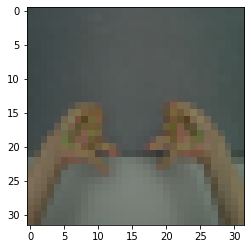

In [ ]:
plt.imshow(x_infer[1000])

In [ ]:
pers_result[1000]

2

In [ ]:
!python

Python 3.7.12 (default, Sep 10 2021, 00:21:48) 
[GCC 7.5.0] on linux
Type "help", "copyright", "credits" or "license" for more information.
>>> exit()


In [ ]:
history.params

{'verbose': 1, 'epochs': 130, 'steps': 11}

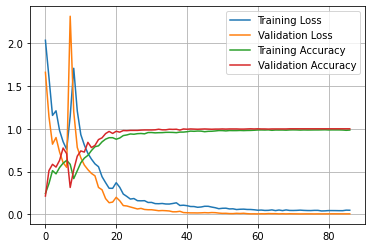

In [ ]:
utils.plot_history(history)

"거의 완벽하게 데이터의 인칭과 사용된 손을 구분하는 이미지 모델을 학습시켰다. 이제 남은건 키포인트를 이용해 손동작을 구분하는 모델을 만드는 것." 자러간다.

#Autogluon Tabular를 이용한 손동작 분류(모델 2개)

##손가락의 Fig 분산정도를 나누어 feature 생성

###함수

In [ ]:
def split_dim(anno):
  x_s = []
  y_s = []
  d_s = []
  for x in range(len(anno)):
    x_s.append(anno[x][0])
    y_s.append(anno[x][1])
    d_s.append(anno[x][2])
  return [x_s, y_s]

In [ ]:
def finger_arr(coord):
  thumb = coord[:5]
  gum = coord[5:9]
  mid = coord[9:13]
  yak = coord[13:17]
  sae = coord[17:21]
  return [thumb, gum, mid, yak, sae]
def mid(arr):
  return np.mean(split_dim(arr)[0]),np.mean(split_dim(arr)[1])

In [ ]:
def curva_trans(coordinates, n):
  x = []
  fin = []
  fin_l = [] 
  fin_r = [] 
  r = []
  k = 0
  rr = 0
  if len(coordinates) == 42:
    
    left = coordinates[:21] 
    right = coordinates[21:]
    
    for x in finger_arr(left):
      mid_x, mid_y = mid(x)
      for y in x:
        rr += np.sqrt(np.square(y[0]-mid_x) + np.square(y[1]-mid_y))
      rr = rr / len(x)
      fin_l.append(rr)
      k += 1
    k = 0
    for x in finger_arr(right):
      mid_x, mid_y = mid(x)
      for y in x:
        rr += np.sqrt(np.square(y[0]-mid_x) + np.square(y[1]-mid_y))
      rr = rr / len(x)
      fin_r.append(rr)
      k += 1

    return [fin_l, fin_r]
 
  elif len(coordinates) == 21:

    for x in finger_arr(coordinates):
      mid_x, mid_y = mid(x)
      for y in x:
        rr += np.sqrt(np.square(y[0]-mid_x) + np.square(y[1]-mid_y))
      rr = rr / len(x)
      fin.append(rr)
      k += 1
    
    return [fin]
  
  else:
    print('error occured')
    ValueError(f"Data lossed. Check the file with {n}")

##생성

In [ ]:
y_tabtr = []
x_tabtr = []

for train_folder in tqdm(train_folders,total = len(train_folders)):
  image_paths = sorted(glob(train_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
  for image_path in image_paths:
    try:
      #################x_train#####################
      x_tabtr.append(curva_trans(json.load(open(glob('/'.join(image_path.split('/')[:4])+'/*.json')[0])).get('annotations')[0].get('data'),image_path))
      #################y_train#####################
      img_num = int(image_path.split('/')[-1].split('.')[0])
      y_tabtr.append(json.load(open(glob('/'.join(image_path.split('/')[:4])+'/*.json')[0])).get('action')[1])
    except Exception as e:
      print(e)
      pass

100%|██████████| 649/649 [00:28<00:00, 22.72it/s]


In [ ]:
pose_data['pose_name'].unique()

array(['숫자 1', '숫자 2', '숫자 3', '숫자 4', '숫자 5', '숫자 6', '숫자 7', '숫자 8',
       '숫자 9', '숫자 0', '손가락 오므리기', '전화모양', '손 안경', '손가락 접기', '손 토끼', '최고',
       '약속', '검지,중지 교차', '엄지,중지 붙이기', '엄지,소지 붙이기', '파이팅', '총', '동그라미',
       'OK', '빅토리', '부정(엄지손 아래로)', '부정(검지 흔들기)', '손바닥', '약지,소지 가위', '꼬집기',
       '엄지,약지 붙이기', '손하트', '네모', '세모', 'X', '숫자1', '숫자2', '숫자6', '숫자7',
       '숫자8', '숫자0', '숫자3', '숫자4', '숫자5', '숫자9', '경고(주먹 내밀기)', '주먹쥐기',
       '큰하트'], dtype=object)

In [ ]:
print(set(y_tabtr))

{'네모', '숫자5', '손바닥', 'OK', '동그라미', '숫자0', '손 안경', '숫자 0', '숫자 9', '엄지,중지 붙이기', '숫자6', '손가락 접기', '숫자7', '손가락 오므리기', '숫자 4', '검지,중지 교차', '숫자2', '손 토끼', '엄지,소지 붙이기', '숫자 2', '세모', '전화모양', '숫자8', '숫자 5', '부정(엄지손 아래로)', '숫자3', '부정(검지 흔들기)', '최고', '숫자 8', '숫자9', '총', '꼬집기', '주먹쥐기', '약속', 'X', '숫자1', '경고(주먹 내밀기)', '숫자4', '숫자 1', '숫자 6', '숫자 7', '숫자 3', '파이팅', '약지,소지 가위', '큰하트', '손하트', '빅토리', '엄지,약지 붙이기'}


In [ ]:
modify = []
for x in y_tabtr:
  x = x.replace('숫자 0','숫자0')
  x = x.replace('숫자 1','숫자1')
  x = x.replace('숫자 2','숫자2')
  x = x.replace('숫자 3','숫자3')
  x = x.replace('숫자 4','숫자4')
  x = x.replace('숫자 5','숫자5')
  x = x.replace('숫자 6','숫자6')
  x = x.replace('숫자 7','숫자7')
  x = x.replace('숫자 8','숫자8')
  x = x.replace('숫자 9','숫자9')
  modify.append(x)

In [ ]:
y_tabtr = modify

In [ ]:
print(set(y_tabtr))

{'네모', '숫자5', '손바닥', 'OK', '동그라미', '숫자0', '손 안경', '숫자6', '엄지,중지 붙이기', '손가락 접기', '숫자7', '손가락 오므리기', '검지,중지 교차', '숫자2', '손 토끼', '엄지,소지 붙이기', '세모', '전화모양', '부정(엄지손 아래로)', '숫자3', '부정(검지 흔들기)', '최고', '주먹쥐기', '숫자9', '총', '꼬집기', '약속', '숫자1', 'X', '경고(주먹 내밀기)', '숫자4', '파이팅', '숫자8', '약지,소지 가위', '큰하트', '손하트', '빅토리', '엄지,약지 붙이기'}


In [ ]:
list = []
x_tabtr_2 = []
y_tabtr_2 = []
for x in range(len(x_tabtr)):
  if len(x_tabtr[x]) == 2:
    x_tabtr_2.append(x_tabtr[x])
    y_tabtr_2.append(y_tabtr[x])
    list.append(x)


In [ ]:
x_tabtr = [x for x in x_tabtr if x not in x_tabtr_2]

In [ ]:
len(x_tabtr)

4798

In [ ]:
awef = []
for x in range(len(y_tabtr)):
  if x not in list:
    awef.append(y_tabtr[x])

In [ ]:
y_tabtr = awef

In [ ]:
len(y_tabtr)

4798

In [ ]:
c = []
for x in range(len(x_tabtr)):
  c.append(pd.DataFrame(x for x in x_tabtr[x]))
x_rad = pd.concat(c,axis = 0,ignore_index=True)
x_rad = x_rad.rename(columns={0:'엄',1:'검',2:'중',3:'약',4:'새'})

In [ ]:
x_rad

,엄,검,중,약,새
0,88.002346,107.859098,68.924699,59.740695,48.176729
1,88.002346,107.859098,68.924699,59.740695,48.176729
2,88.002346,107.859098,68.924699,59.740695,48.176729
3,88.002346,107.859098,68.924699,59.740695,48.176729
4,88.002346,107.859098,68.924699,59.740695,48.176729
...,...,...,...,...,...
4793,80.240297,71.214007,77.371706,79.570389,70.011460
4794,80.240297,71.214007,77.371706,79.570389,70.011460
4795,80.240297,71.214007,77.371706,79.570389,70.011460
4796,80.240297,71.214007,77.371706,79.570389,70.011460


In [ ]:
a = []
b = []
for x in range(len(x_tabtr_2)):
  a.append(pd.DataFrame(x for x in [x_tabtr_2[x][0]]))
  b.append(pd.DataFrame(x for x in [x_tabtr_2[x][1]]))
x_left = pd.concat(a,axis = 0,ignore_index=True)
x_left = x_left.rename(columns={0:'엄l',1:'검l',2:'중l',3:'약l',4:'새l'})
x_right = pd.concat(b,ignore_index=True)
x_right = x_right.rename(columns={0:'엄r',1:'검r',2:'중r',3:'약r',4:'새r'})
x_both_rad = pd.concat([x_left,x_right],axis = 1)

In [ ]:
x_both_rad

,엄l,검l,중l,약l,새l,엄r,검r,중r,약r,새r
0,126.138990,79.812665,61.715426,64.450628,51.349422,128.792219,88.691730,68.636352,67.477002,49.645300
1,126.138990,79.812665,61.715426,64.450628,51.349422,128.792219,88.691730,68.636352,67.477002,49.645300
2,126.138990,79.812665,61.715426,64.450628,51.349422,128.792219,88.691730,68.636352,67.477002,49.645300
3,126.138990,79.812665,61.715426,64.450628,51.349422,128.792219,88.691730,68.636352,67.477002,49.645300
4,126.138990,79.812665,61.715426,64.450628,51.349422,128.792219,88.691730,68.636352,67.477002,49.645300
...,...,...,...,...,...,...,...,...,...,...
1085,67.985098,45.508415,41.838146,41.390454,33.983961,72.733999,42.981464,38.181053,39.157431,34.572718
1086,67.985098,45.508415,41.838146,41.390454,33.983961,72.733999,42.981464,38.181053,39.157431,34.572718
1087,67.985098,45.508415,41.838146,41.390454,33.983961,72.733999,42.981464,38.181053,39.157431,34.572718
1088,67.985098,45.508415,41.838146,41.390454,33.983961,72.733999,42.981464,38.181053,39.157431,34.572718


In [ ]:
single_hand = pd.concat([x_rad, pd.DataFrame(y_tabtr).rename(columns = {0:'idx'})],axis=1)
both_hand = pd.concat([x_both_rad, pd.DataFrame(y_tabtr_2).rename(columns = {0:'idx'})],axis=1)

In [ ]:
fit_args = {}
fit_args['excluded_model_types'] = ['NN', 'FASTAI']

In [ ]:
mom = single_hand.sample(frac=1)

In [ ]:
predictor_single = TabularPredictor(label='idx').fit(mom.iloc[:4298],**fit_args)
performance = predictor_single.evaluate(mom.iloc[4298:])

No path specified. Models will be saved in: "AutogluonModels/ag-20211014_114741/"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels/ag-20211014_114741/"
AutoGluon Version:  0.3.1
Train Data Rows:    4298
Train Data Columns: 5
Preprocessing data ...
AutoGluon infers your prediction problem is: 'multiclass' (because dtype of label-column == object).
	First 10 (of 38) unique label values:  ['손바닥', '파이팅', '세모', '전화모양', '손 안경', '부정(검지 흔들기)', '총', '엄지,소지 붙이기', '엄지,중지 붙이기', '손가락 접기']
	If 'multiclass' is not the correct problem_type, please manually specify the problem_type argument in fit() (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Fraction of data from classes with at least 10 examples that will be kept for training models: 0.9958120055839925
Train Data Class Count: 36
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    11962.57 MB
	Train Data (

In [ ]:
predictor_single.leaderboard(mom.iloc[4298:],silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,LightGBMLarge,0.996,1.000000,0.021300,0.007059,15.538140,0.021300,0.007059,15.538140,1,True,11
1,LightGBM,0.996,1.000000,0.044509,0.017185,4.831550,0.044509,0.017185,4.831550,1,True,4
2,KNeighborsDist,0.996,1.000000,0.115673,0.103620,0.011531,0.115673,0.103620,0.011531,1,True,2
3,RandomForestGini,0.996,1.000000,0.369289,0.203647,1.653317,0.369289,0.203647,1.653317,1,True,5
4,RandomForestEntr,0.996,1.000000,0.375076,0.203592,2.855178,0.375076,0.203592,2.855178,1,True,6
5,XGBoost,0.996,1.000000,0.415201,0.017808,4.495556,0.415201,0.017808,4.495556,1,True,10
6,ExtraTreesGini,0.996,1.000000,0.428691,0.203836,1.152327,0.428691,0.203836,1.152327,1,True,8
7,ExtraTreesEntr,0.996,1.000000,0.434470,0.205379,1.260110,0.434470,0.205379,1.260110,1,True,9
8,WeightedEnsemble_L2,0.996,1.000000,0.441941,0.204468,1.799243,0.013251,0.000632,0.646916,2,True,12
9,LightGBMXT,0.996,1.000000,0.983252,0.746895,9.427982,0.983252,0.746895,9.427982,1,True,3


In [ ]:
dad = both_hand.sample(frac=1)

In [ ]:
predictor_single.feature_importance(mom.iloc[990:], subsample_size=None, time_limit=60)

Computing feature importance via permutation shuffling for 5 features using 3790 rows with 10 shuffle sets... Time limit: 60s...
	37.59s	= Expected runtime (3.76s per shuffle set)
	16.67s	= Actual runtime (Completed 10 of 10 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
새,0.424591,0.006894,6.305813e-18,10,0.431676,0.417506
중,0.391583,0.005007,7.350468e-19,10,0.396729,0.386438
검,0.369208,0.004473,4.520863e-19,10,0.373805,0.364612
약,0.330950,0.005179,4.530617e-18,10,0.336273,0.325627
엄,0.222955,0.005113,1.410339e-16,10,0.228210,0.217700


In [ ]:
predictor_both = TabularPredictor(label='idx').fit(dad.iloc[:990],**fit_args)
performance = predictor_both.evaluate(dad.iloc[990:])

No path specified. Models will be saved in: "AutogluonModels/ag-20211014_114927/"
Beginning AutoGluon training ...
AutoGluon will save models to "AutogluonModels/ag-20211014_114927/"
AutoGluon Version:  0.3.1
Train Data Rows:    990
Train Data Columns: 10
Preprocessing data ...
AutoGluon infers your prediction problem is: 'multiclass' (because dtype of label-column == object).
	First 10 (of 25) unique label values:  ['빅토리', '약속', '손 안경', '꼬집기', 'OK', '손가락 오므리기', '주먹쥐기', '총', '검지,중지 교차', '부정(엄지손 아래로)']
	If 'multiclass' is not the correct problem_type, please manually specify the problem_type argument in fit() (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Train Data Class Count: 25
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    11926.5 MB
	Train Data (Original)  Memory Usage: 0.08 MB (0.0% of available memory)
	Inferring data type of each feature based on column values.

In [ ]:
predictor_both.leaderboard(dad.iloc[990:],silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,CatBoost,1.0,1.0,0.011049,0.003590,6.868935,0.011049,0.003590,6.868935,1,True,7
1,LightGBMLarge,1.0,1.0,0.014530,0.004681,7.321728,0.014530,0.004681,7.321728,1,True,11
2,LightGBM,1.0,1.0,0.019203,0.006790,2.465177,0.019203,0.006790,2.465177,1,True,4
3,LightGBMXT,1.0,1.0,0.035110,0.022197,2.112773,0.035110,0.022197,2.112773,1,True,3
4,KNeighborsUnif,1.0,1.0,0.105203,0.103734,0.012474,0.105203,0.103734,0.012474,1,True,1
5,KNeighborsDist,1.0,1.0,0.114044,0.104316,0.015454,0.114044,0.104316,0.015454,1,True,2
6,XGBoost,1.0,1.0,0.221591,0.005906,1.132919,0.221591,0.005906,1.132919,1,True,10
7,RandomForestGini,1.0,1.0,0.249288,0.204203,1.056473,0.249288,0.204203,1.056473,1,True,5
8,ExtraTreesGini,1.0,1.0,0.255659,0.203698,0.956066,0.255659,0.203698,0.956066,1,True,8
9,RandomForestEntr,1.0,1.0,0.262304,0.203307,1.256545,0.262304,0.203307,1.256545,1,True,6


In [ ]:
predictor_both.feature_importance(dad.iloc[990:], subsample_size=None, time_limit=60)

Computing feature importance via permutation shuffling for 10 features using 100 rows with 10 shuffle sets... Time limit: 60s...
	28.33s	= Expected runtime (2.83s per shuffle set)
	2.92s	= Actual runtime (Completed 10 of 10 shuffle sets)


,importance,stddev,p_value,n,p99_high,p99_low
새l,0.143,0.027101,2.228941e-08,10,0.170851,0.115149
약r,0.042,0.016865,1.254851e-05,10,0.059332,0.024668
엄l,0.033,0.012517,7.945242e-06,10,0.045863,0.020137
새r,0.031,0.007379,1.610610e-07,10,0.038583,0.023417
중l,0.004,0.005164,1.839375e-02,10,0.009307,-0.001307
검r,0.003,0.004830,4.056309e-02,10,0.007964,-0.001964
중r,0.002,0.004216,8.392533e-02,10,0.006333,-0.002333
엄r,0.000,0.000000,5.000000e-01,10,0.000000,0.000000
약l,0.000,0.000000,5.000000e-01,10,0.000000,0.000000
검l,0.000,0.000000,5.000000e-01,10,0.000000,0.000000


In [ ]:
y_tabtr = []
x_tabtr = []

for train_folder in tqdm(train_folders,total = len(train_folders)):
  image_paths = sorted(glob(train_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
  for image_path in image_paths:
    try:
      #################x_train#####################
      x_tabtr.append(curva_trans(json.load(open(glob('/'.join(image_path.split('/')[:4])+'/*.json')[0])).get('annotations')[0].get('data'),image_path))
      #################y_train#####################
      img_num = int(image_path.split('/')[-1].split('.')[0])
      y_tabtr.append(json.load(open(glob('/'.join(image_path.split('/')[:4])+'/*.json')[0])).get('action')[1])
    except Exception as e:
      print(e)
      pass

In [ ]:
x_tabts = []
for test_folder in tqdm(test_folders,total = len(test_folders)):
  image_paths = sorted(glob(test_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
  for image_path in image_paths:
    try:
      #################x_test#####################
      x_tabts.append(curva_trans(json.load(open(glob('/'.join(image_path.split('/')[:4])+'/*.json')[0])).get('annotations')[0].get('data'),image_path))
    except Exception as e:
      pass

100%|██████████| 217/217 [00:51<00:00,  4.23it/s]


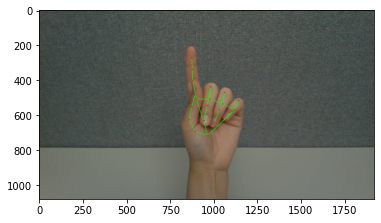

In [ ]:
plt.imshow(Image.open(sorted(glob(test_folders[0] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))[0]))

In [ ]:
glob('/'.join(image_paths[0].split('/')[:4])+'/*.json')[0]

'./open/train/648/648.json'

In [ ]:
sorted(glob(test_folders[0] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))[0]

'./open/test/649/0.png'

In [ ]:
curva_trans(json.load(open(glob('/'.join(image_paths[4].split('/')[:4])+'/*.json')[0])).get('annotations')[0].get('data'),image_path)

[[67.98509835663404,
  45.5084154505801,
  41.838146313053656,
  41.39045392448204,
  33.98396121808763],
 [72.73399943864312,
  42.98146395166846,
  38.18105337562264,
  39.15743076003518,
  34.57271814512182]]

In [ ]:
list_ts = []
x_tabts_2 = []
for x in range(len(x_tabts)):
  if len(x_tabts[x]) == 2:
    x_tabts_2.append(x_tabts[x])
    list_ts.append(x)

In [ ]:
len(x_tabts_2)+len(x_tabts)

2038

In [ ]:
x_tabts = [x for x in x_tabts if x not in x_tabts_2]

In [ ]:
c = []
for x in range(len(x_tabts)):
  c.append(pd.DataFrame(x for x in x_tabts[x]))
x_rad_ts = pd.concat(c,axis = 0,ignore_index=True)
x_rad_ts = x_rad_ts.rename(columns={0:'엄',1:'검',2:'중',3:'약',4:'새'})

In [ ]:
a = []
b = []
for x in range(len(x_tabts_2)):
  a.append(pd.DataFrame(x for x in [x_tabts_2[x][0]]))
  b.append(pd.DataFrame(x for x in [x_tabts_2[x][1]]))
x_left_ts = pd.concat(a,axis = 0,ignore_index=True)
x_left_ts = x_left_ts.rename(columns={0:'엄l',1:'검l',2:'중l',3:'약l',4:'새l'})
x_right_ts = pd.concat(b,ignore_index=True)
x_right_ts = x_right_ts.rename(columns={0:'엄r',1:'검r',2:'중r',3:'약r',4:'새r'})
x_both_rad_ts = pd.concat([x_left_ts,x_right_ts],axis = 1)

In [ ]:
x_both_rad_ts

,엄l,검l,중l,약l,새l,엄r,검r,중r,약r,새r
0,102.011687,79.735438,51.933932,45.137233,34.062221,108.166423,87.995161,53.746668,51.942322,40.782907
1,102.011687,79.735438,51.933932,45.137233,34.062221,108.166423,87.995161,53.746668,51.942322,40.782907
2,102.011687,79.735438,51.933932,45.137233,34.062221,108.166423,87.995161,53.746668,51.942322,40.782907
3,102.011687,79.735438,51.933932,45.137233,34.062221,108.166423,87.995161,53.746668,51.942322,40.782907
4,102.011687,79.735438,51.933932,45.137233,34.062221,108.166423,87.995161,53.746668,51.942322,40.782907
...,...,...,...,...,...,...,...,...,...,...
363,76.085210,53.646389,51.448616,47.363978,32.716650,84.572721,54.492069,50.023529,47.959218,39.971949
364,76.085210,53.646389,51.448616,47.363978,32.716650,84.572721,54.492069,50.023529,47.959218,39.971949
365,76.085210,53.646389,51.448616,47.363978,32.716650,84.572721,54.492069,50.023529,47.959218,39.971949
366,76.085210,53.646389,51.448616,47.363978,32.716650,84.572721,54.492069,50.023529,47.959218,39.971949


In [ ]:
res_sin = predictor_single.predict(x_rad_ts)

In [ ]:
res_both = predictor_both.predict(x_both_rad_ts)

In [ ]:
len(res_sin)+len(res_both)

2038

In [ ]:
y_ts = []
a = 0
b = 0
for x in range(len(res_sin)+len(res_both)):
  if x in list_ts:
    y_ts.append(res_both[a])
    a += 1
  else:
    y_ts.append(res_sin[b])
    b += 1

In [ ]:
sorted(glob(test_folders[10] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))

['./open/test/659/0.png',
 './open/test/659/1.png',
 './open/test/659/2.png',
 './open/test/659/3.png',
 './open/test/659/4.png',
 './open/test/659/5.png',
 './open/test/659/6.png',
 './open/test/659/7.png',
 './open/test/659/8.png',
 './open/test/659/9.png']

In [ ]:
a = 0
for x in range(len(test_folders)):
  for y in range(len(sorted(glob(test_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png',''))))):
    plt.imshow(Image.open(sorted(glob(test_folders[x] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))[y]))
    plt.show()
    print(y_ts[a])
    a += 1
print(a)
  

In [ ]:
len(x_both_rad_ts)+len(x_rad_ts)

2038

In [ ]:
len(y_ts)

2038

In [ ]:
'''
    right  left   both
1st   0      1      2
3rd   3      4      5
'''

In [ ]:
a = ['숫자 0','숫자 1','숫자 2','숫자 3','숫자 4','숫자 5','숫자 6','숫자 7','숫자 8','숫자 9']
b = ['숫자0','숫자1','숫자2','숫자3','숫자4','숫자5','숫자6','숫자7','숫자8','숫자9']
for x in range(len(a)):
  hand_gesture['pose_name']= hand_gesture['pose_name'].replace(a[x],b[x])

In [ ]:
hand_gesture[(hand_gesture['pose_name'] == x_hand) & (hand_gesture['view_type'] == view_type)]['pose_id']

SyntaxError: ignored

In [ ]:
hand_gesture[(hand_gesture['pose_name'] == x_hand)]['pose_id'].iat[0]

3

In [ ]:
hand_gesture['pose_name']
predictions = []
for x in range(len(y_ts)):
  x_pers = pers_result[x]
  x_hand = y_ts[x]
  if x_pers == 0:
    view_type = '1st'
    hand_type = 'right'
  elif x_pers == 1:
    view_type = '1st'
    hand_type = 'left'
  elif x_pers == 2:
    view_type = '1st'
    hand_type = 'both'
  elif x_pers == 3:
    view_type = '3rd'
    hand_type = 'right'
  elif x_pers == 4:
    view_type = '3rd'
    hand_type = 'left'
  else:
    view_type = '3rd'
    hand_type = 'both'
  print(x)
  try:
    pred = hand_gesture[(hand_gesture['pose_name'] == x_hand) & (hand_gesture['view_type'] == view_type) & (hand_gesture['hand_type'] == hand_type)]['pose_id'].iat[0]
  except Exception as e:
    print(e)
    pred = hand_gesture[(hand_gesture['pose_name'] == x_hand)]['pose_id'].iat[0]
  predictions.append(pred)

In [ ]:
len(predictions)

2038

In [ ]:
a = 0
predict_val = []
for test_folder in tqdm(test_folders,total = len(test_folders)):
  image_paths = sorted(glob(test_folder + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))
  temp = []
  for x in range(len(image_paths)):
    temp.append(predictions[a])
    a += 1
  predict_val.append(np.mean(temp))

100%|██████████| 217/217 [00:00<00:00, 968.63it/s] 


In [ ]:
a = f'Label_{int(predict_val[0])}'

In [ ]:
sample_submission[a][0]

0

In [ ]:
sample_submission.columns[int(predict_val[0])+1]

'Label_28'

In [ ]:
for x in range(len(predict_val)):
  a = f'Label_{int(predict_val[x])}'
  sample_submission[a][x] = 1

In [ ]:
sample_submission.to_csv('first_attemp.csv')

In [ ]:
sorted(glob(test_folders[10] + '/*.png'), key = lambda x : int(x.split('/')[-1].replace('.png','')))[0]

'./open/test/659/0.png'

In [ ]:
y_ts[20]

'빅토리'

In [ ]:
!python